# Image Filtering: Spatial vs Frequency Domain — Hands-on Notebook

This notebook contains theory and runnable code examples for:
- Noise models (Gaussian, Salt & Pepper)
- Spatial-domain filters: median, Gaussian (manual + OpenCV), bilateral
- Frequency-domain filtering using FFT (Gaussian LPF/HPF)

Run the cells in order. Change parameters in the **Try-it** cells to explore.

In [1]:
# Basic imports
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import convolve
from scipy.signal import medfilt2d
import os

from numpy.fft import fft2, ifft2, fftshift
import cv2
import time


In [2]:
# Helper functions: load image, noise addition, metrics, kernels

def load_gray_image(path=None):
    """Load a grayscale image normalized to [0,1]"""

    im = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    print(im.shape)
    return im.astype(np.float32)/255.0

def add_gaussian_noise(image, mean=0.0, var=0.2):
    sigma = np.sqrt(var)
    gauss = np.random.normal(mean, sigma, image.shape).astype(np.float32)
    noisy = image + gauss
    return np.clip(noisy, 0.0, 1.0)

def add_salt_pepper_noise(image, salt_prob=0.01, pepper_prob=0.01):
    noisy = image.copy()
    # Salt
    num_salt = np.ceil(salt_prob * image.size).astype(int)
    coords = (np.random.randint(0, i, num_salt) for i in image.shape)
    noisy[tuple(coords)] = 1.0
    # Pepper
    num_pepper = np.ceil(pepper_prob * image.size).astype(int)
    coords = (np.random.randint(0, i, num_pepper) for i in image.shape)
    noisy[tuple(coords)] = 0.0
    return noisy

def gaussian_kernel(size, sigma=1.0):
    ax = np.arange(-size//2 + 1., size//2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2. * sigma**2))
    kernel = kernel / np.sum(kernel)
    return kernel


## 1) Noise models

We will demonstrate two common noise models:

- **Gaussian noise**: additive zero-mean Gaussian with variance $\sigma^2$.
- **Salt & Pepper noise**: random pixels set to 0 (pepper) or 1 (salt).

Change the variance and observe how filtering performance changes.

(256, 256)


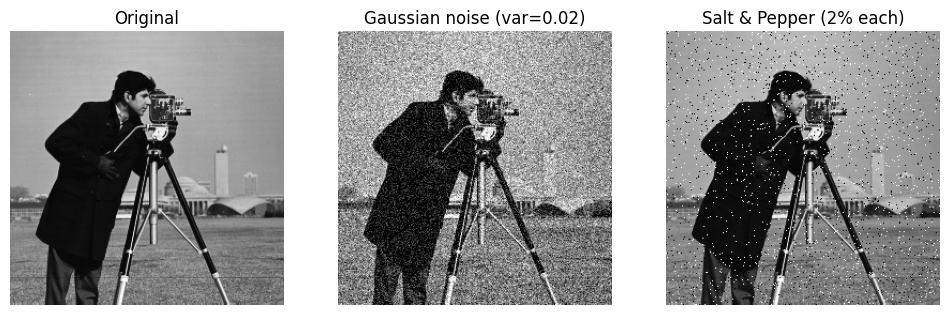

In [3]:
# Load image and show noisy versions
img = load_gray_image("cameraman.jpeg")
np.random.seed(0)

img_gauss = add_gaussian_noise(img, var=0.02)
img_sp = add_salt_pepper_noise(img, salt_prob=0.02, pepper_prob=0.02)

plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(img, cmap='gray'); plt.title('Original'); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(img_gauss, cmap='gray'); plt.title('Gaussian noise (var=0.02)'); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(img_sp, cmap='gray'); plt.title('Salt & Pepper (2% each)'); plt.axis('off')
plt.show()

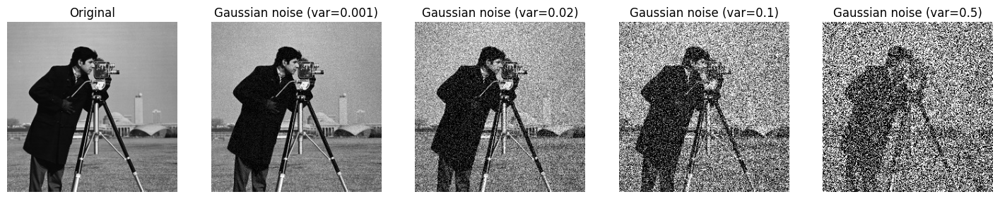

In [4]:
img_gauss_smallest = add_gaussian_noise(img, var=0.001)
img_gauss_small = add_gaussian_noise(img, var = 0.02)
img_gauss_med = add_gaussian_noise(img, var = 0.1)
img_gauss_large = add_gaussian_noise(img, var = 0.5)

plt.figure(figsize=(18, 12))
plt.subplot(1,5,1); plt.imshow(img, cmap='gray'); plt.title('Original'); plt.axis('off')
plt.subplot(1,5,2); plt.imshow(img_gauss_smallest, cmap='gray'); plt.title('Gaussian noise (var=0.001)'); plt.axis('off')
plt.subplot(1,5,3); plt.imshow(img_gauss_small, cmap='gray'); plt.title('Gaussian noise (var=0.02)'); plt.axis('off')
plt.subplot(1,5,4); plt.imshow(img_gauss_med, cmap='gray'); plt.title('Gaussian noise (var=0.1)'); plt.axis('off')
plt.subplot(1,5,5); plt.imshow(img_gauss_large, cmap='gray'); plt.title('Gaussian noise (var=0.5)'); plt.axis('off')
plt.show()

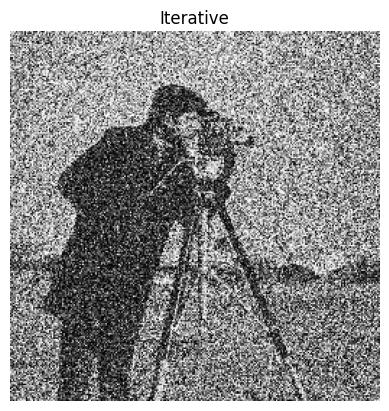

In [5]:
n = 100
img_gauss_n = np.copy(img)
for i in range(n):
    img_gauss_n = add_gaussian_noise(img_gauss_n, var = 0.001)
plt.imshow(img_gauss_n, cmap = 'gray'); plt.title('Iterative'); plt.axis('off')
plt.show()

## 2) Spatial-domain filters

**Box Filter**: Kernel has all values as the same

**Gaussian filter** (linear): convolution with a Gaussian kernel; good for smoothing Gaussian noise. Kernel equation:

$$
G(x,y) = \frac{1}{2\pi\sigma^2} e^{-\frac{x^2+y^2}{2\sigma^2}}
$$

**Bilateral filter**: edge-preserving filter that weights both spatial distance and intensity difference.

### Bilateral Filter

The bilateral filter computes the output intensity at a pixel $p$ as:

$$
I_{out}(p) = \frac{1}{W_p} \sum_{q \in \Omega} I(q) \;
\exp\left(-\frac{\|p-q\|^2}{2\sigma_s^2}\right) \;
\exp\left(-\frac{(I(p)-I(q))^2}{2\sigma_r^2}\right)
$$

where:

- $I(p)$ : intensity at pixel $p$  
- $\Omega$ : neighborhood around $p$  
- $\sigma_s$ : spatial smoothing parameter (`sigmaSpace`)  
- $\sigma_r$ : range smoothing parameter (`sigmaColor`)  
- $W_p$ : normalization term, given by  

$$
W_p = \sum_{q \in \Omega}
\exp\left(-\frac{\|p-q\|^2}{2\sigma_s^2}\right) \;
\exp\left(-\frac{(I(p)-I(q))^2}{2\sigma_r^2}\right)
$$


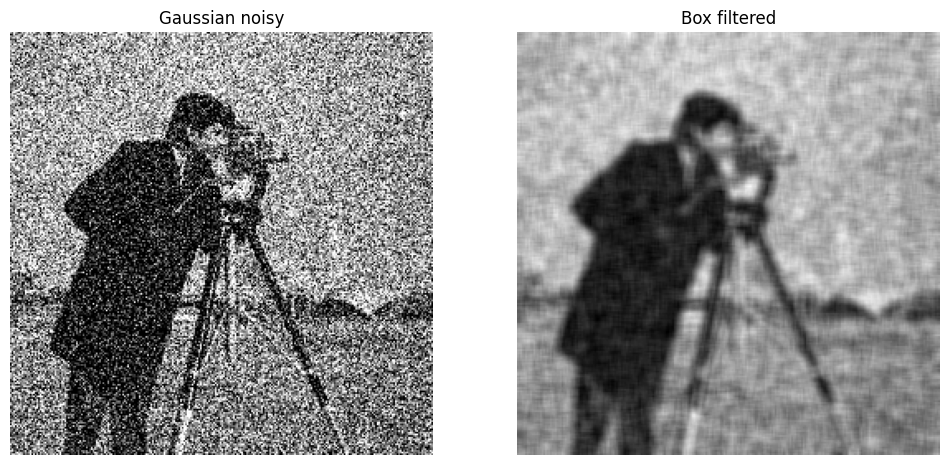

In [6]:
# Box Filter
N = 7
kern = np.ones((N, N)) / (N*N)
box_from_manual = convolve(img_gauss_med, kern, mode='reflect')

# Show
plt.figure(figsize=(12,6))
plt.subplot(1,2,1); plt.imshow(img_gauss_med, cmap='gray'); plt.title('Gaussian noisy'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(box_from_manual, cmap='gray'); plt.title('Box filtered'); plt.axis('off')
plt.show()

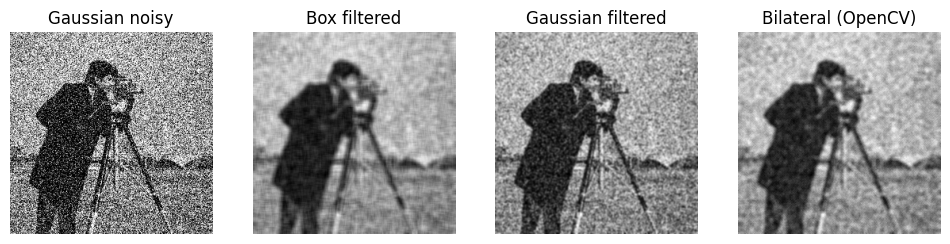

In [7]:
# Gaussian filter manual (convolution)
kern = gaussian_kernel(7, sigma=1)
gauss_from_manual = convolve(img_gauss_med, kern, mode='reflect')
# Bilateral filter (OpenCV) on u8
bilat = cv2.bilateralFilter(img_gauss_med, d=7, sigmaColor=75, sigmaSpace=75).astype(np.float32)/255.0

# Show
plt.figure(figsize=(12,6))
plt.subplot(1,4,1); plt.imshow(img_gauss_med, cmap='gray'); plt.title('Gaussian noisy'); plt.axis('off')
plt.subplot(1,4,2); plt.imshow(box_from_manual, cmap='gray'); plt.title('Box filtered'); plt.axis('off')
plt.subplot(1,4,3); plt.imshow(gauss_from_manual, cmap='gray'); plt.title('Gaussian filtered'); plt.axis('off')
plt.subplot(1,4,4); plt.imshow(bilat, cmap='gray'); plt.title('Bilateral (OpenCV)'); plt.axis('off')
plt.show()

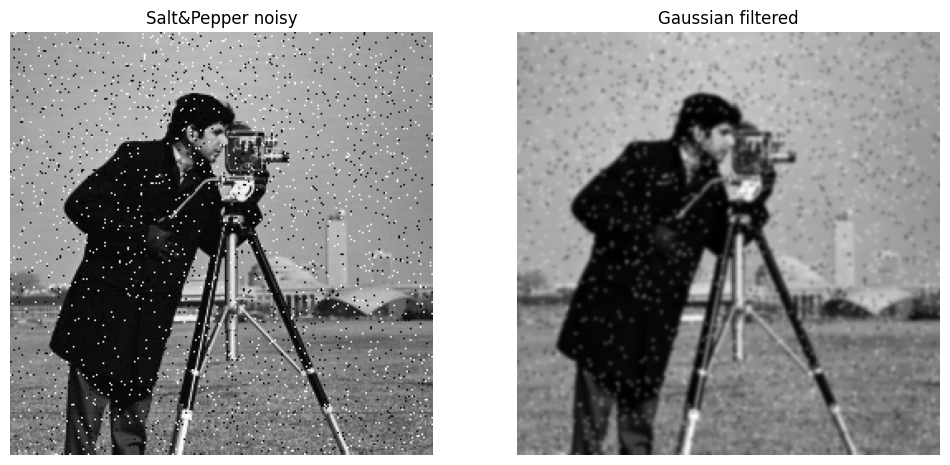

In [8]:
gauss_sp = convolve(img_sp, kern, mode='reflect')

plt.figure(figsize=(12,6))
plt.subplot(1,2,1); plt.imshow(img_sp, cmap='gray'); plt.title('Salt&Pepper noisy'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(gauss_sp, cmap='gray'); plt.title('Gaussian filtered'); plt.axis('off')
plt.show()

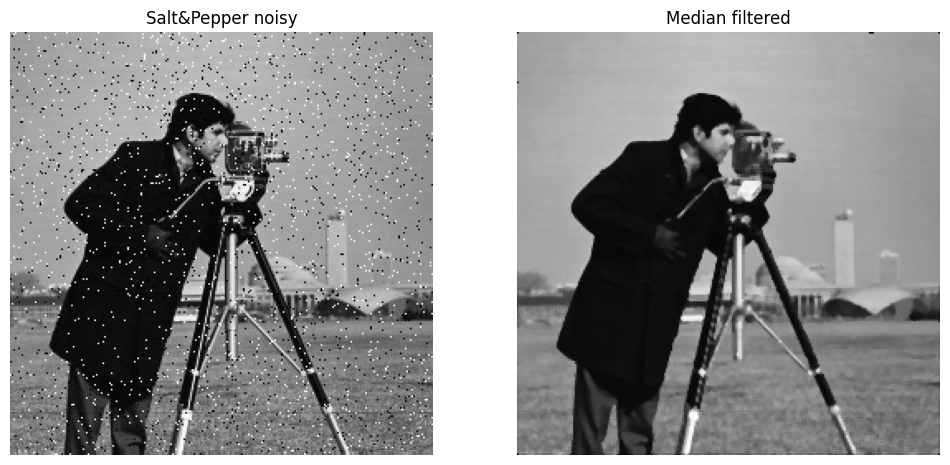

In [9]:
med_sp = medfilt2d(img_sp, kernel_size=3)

plt.figure(figsize=(12,6))
plt.subplot(1,2,1); plt.imshow(img_sp, cmap='gray'); plt.title('Salt&Pepper noisy'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(med_sp, cmap='gray'); plt.title('Median filtered'); plt.axis('off')
plt.show()

Manual Median Filter Time: 1.8436 s
SciPy medfilt2d Time: 0.0105 s
Max Pixel Difference: 0.615686297416687


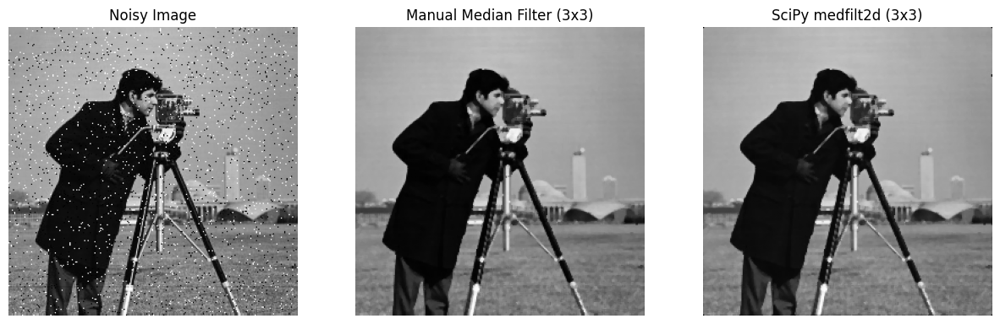

In [10]:

noisy_img = add_salt_pepper_noise(img, salt_prob=0.02, pepper_prob=0.02)
# -------------------- Manual Median Filter --------------------
def manual_median_filter(image, kernel_size=3):
  # write your code here
    pad = kernel_size // 2
    padded = np.pad(image, pad, mode='edge')
    output = np.zeros_like(image)

    H, W = image.shape
    for i in range(H):
        for j in range(W):
            window = padded[i:i + kernel_size, j:j + kernel_size]
            output[i, j] = np.median(window)
    return output

# -------------------- Compare Speed --------------------
ksize = 3

# Manual filter
t1 = time.time()
manual_filtered = manual_median_filter(noisy_img, kernel_size=ksize)
t2 = time.time()

# Built-in medfilt2d
t3 = time.time()
scipy_filtered = medfilt2d(noisy_img, kernel_size=ksize)
t4 = time.time()

print(f"Manual Median Filter Time: {(t2 - t1):.4f} s")
print(f"SciPy medfilt2d Time: {(t4 - t3):.4f} s")
print(f"Max Pixel Difference: {np.abs(manual_filtered - scipy_filtered).max()}")

# -------------------- Plot Results --------------------
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(noisy_img, cmap='gray')
axs[0].set_title("Noisy Image")
axs[0].axis("off")

axs[1].imshow(manual_filtered, cmap='gray')
axs[1].set_title(f"Manual Median Filter ({ksize}x{ksize})")
axs[1].axis("off")

axs[2].imshow(scipy_filtered, cmap='gray')
axs[2].set_title(f"SciPy medfilt2d ({ksize}x{ksize})")
axs[2].axis("off")

plt.show()


## 3) Frequency-domain filtering (FFT)

Fourier transform (2D discrete):

$$
F(u,v) = \sum_{x=0}^{M-1} \sum_{y=0}^{N-1} f(x,y) e^{-j 2\pi (ux/M + vy/N)}
$$

We will build Gaussian low-pass and high-pass filters in the frequency domain. Steps:
1. Compute FFT of image
2. Shift zero-frequency to center (fftshift)
3. Multiply spectrum by filter mask
4. Inverse shift and inverse FFT



In [11]:
# Function to compute FFT and return fshift + magnitude spectrum
def compute_fft(img):
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.log(np.abs(fshift) + 1)
    return fshift, magnitude_spectrum

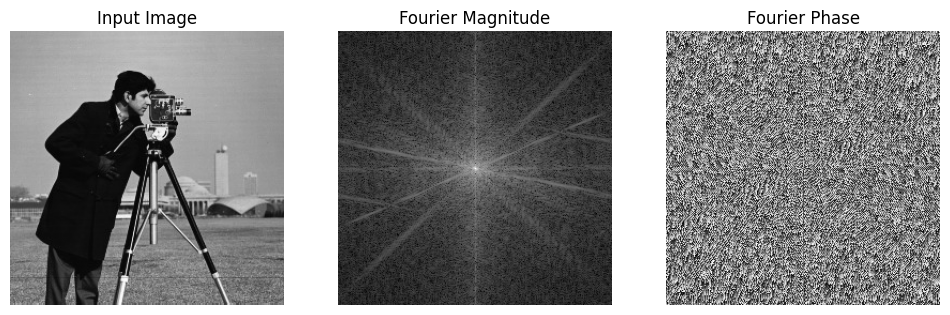

In [12]:
def plot_fourier(img):
    fshift_img, mag_img = compute_fft(img)
    phase = np.angle(fshift_img)
    plt.figure(figsize=(12, 6))
    plt.subplot(1,3,1)
    plt.imshow(img, cmap='gray', vmin = 0, vmax = 1)
    plt.title("Input Image")
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.imshow(mag_img, cmap = 'gray')
    plt.title("Fourier Magnitude")
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.imshow(phase, cmap="gray")
    plt.title("Fourier Phase")
    plt.axis('off')


plot_fourier(img)

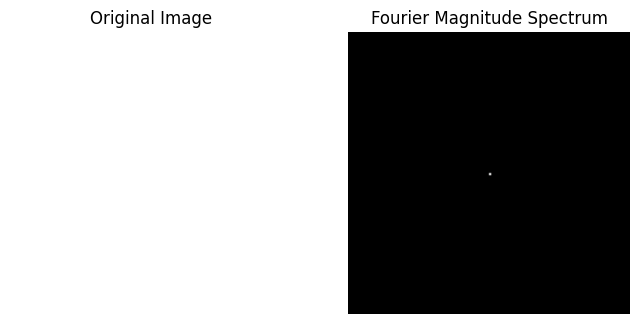

In [13]:
def save_and_plot_fft(img, img_name="image", spectrum_name="spectrum"):
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.log1p(np.abs(fshift))  # log scaling

    plt.imsave(f"{img_name}.png", img, cmap="gray", vmin=0, vmax=1)

    plt.imsave(f"{spectrum_name}.png", magnitude_spectrum, cmap="gray")

    plt.figure(figsize=(8,4))

    plt.subplot(1,2,1)
    plt.imshow(img, cmap="gray", vmin=0, vmax=1)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(magnitude_spectrum, cmap="gray")
    plt.title("Fourier Magnitude Spectrum")
    plt.axis("off")

    plt.show()

solid_image = np.ones(shape = (128, 128))
save_and_plot_fft(solid_image, "solid", "solid_spectrum")

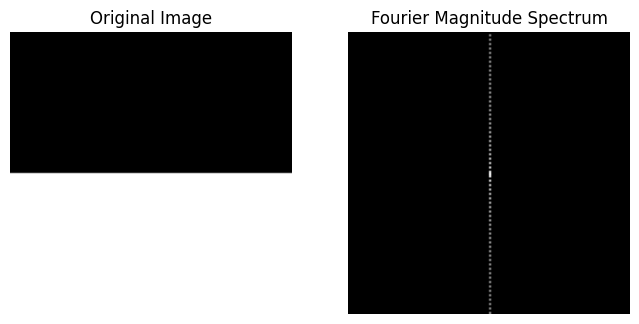

In [14]:
def step_edge_x(height=128, width=128):
    img = np.zeros((height, width))
    img[:, width//2:] = 1   # right half white
    return img

def step_edge_y(height=128, width=128):
    img = np.zeros((height, width))
    img[height//2:, :] = 1  # bottom half white
    return img
img_x = step_edge_x()
img_y = step_edge_y()
save_and_plot_fft(img_y, "stepy", "stepy_spectrum")

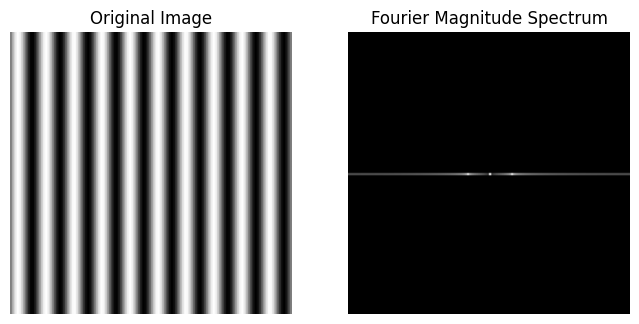

In [15]:
def sinusoidal_images(size=128, freq=5):
    x = np.linspace(0, 2*np.pi, size)
    y = np.linspace(0, 2*np.pi, size)
    xx, yy = np.meshgrid(x, y)

    # Sinusoid varying in x-direction (vertical stripes)
    x_sin = 0.5 * (1 + np.sin(freq * xx))  # normalize to [0,1]

    # Sinusoid varying in y-direction (horizontal stripes)
    y_sin = 0.5 * (1 + np.sin(freq * yy))  # normalize to [0,1]

    return x_sin, y_sin

# Example usage
xsin_img, ysin_img = sinusoidal_images(size=128, freq=10)
save_and_plot_fft(xsin_img, "sinx", "sinx_spectrum")

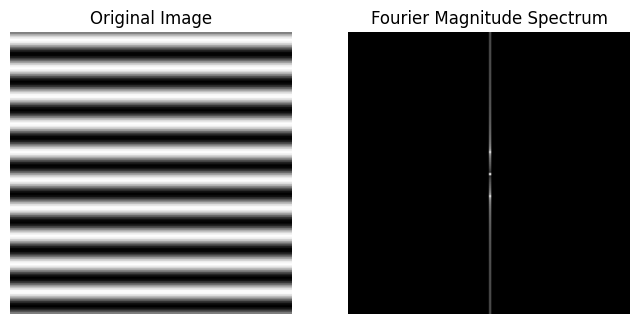

In [16]:
save_and_plot_fft(ysin_img, "siny", "siny_spectrum")

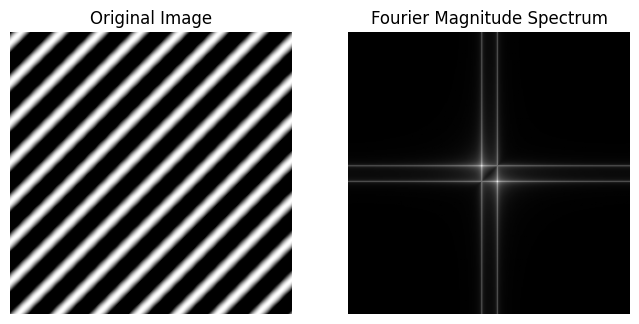

In [17]:
def generate_45deg_sinusoid(size=256, frequency=10):
    x = np.arange(size)
    y = np.arange(size)
    X, Y = np.meshgrid(x, y)

    coord = (X + Y) / np.sqrt(2)

    sinusoid = np.sin(2 * np.pi * frequency * coord / size)

    return sinusoid

# Example usage
sin45_img = generate_45deg_sinusoid(size=256, frequency=10)
save_and_plot_fft(sin45_img, "sin45", "sin45_spectrum")


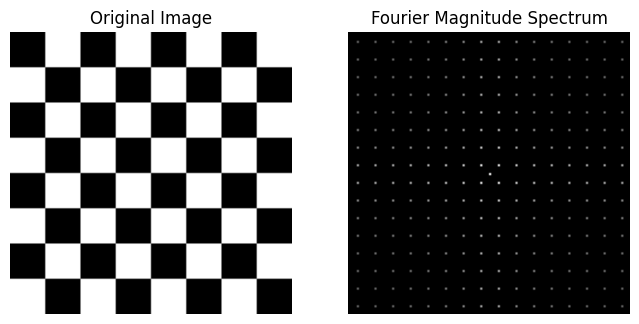

In [18]:

def generate_chessboard(size=256, num_squares=8):
    # Pixel grid
    x = np.arange(size)
    y = np.arange(size)
    X, Y = np.meshgrid(x, y)

    # Size of each square
    square_size = size // num_squares

    # Alternating pattern using integer division
    board = ((X // square_size) + (Y // square_size)) % 2

    return board

# Example usage
chessboard_img = generate_chessboard(size=128, num_squares=8)
save_and_plot_fft(chessboard_img, "chessboard", "chessboard_spectrum")

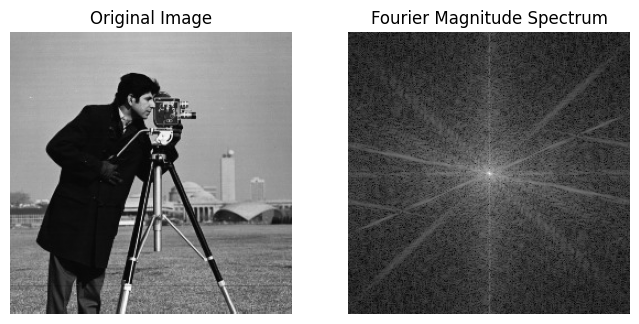

In [19]:
save_and_plot_fft(img, "cameraman", "cameraman_spectrum")

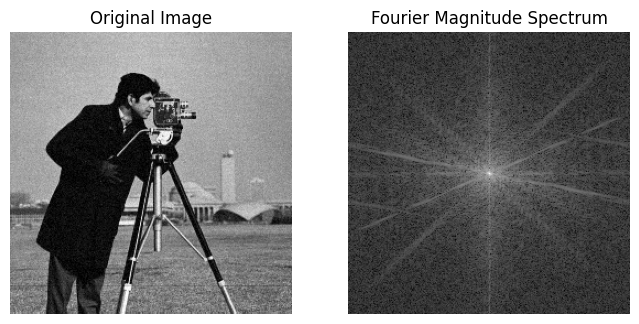

In [20]:
save_and_plot_fft(img_gauss_smallest, "camgauss", "camgauss_spectrum")

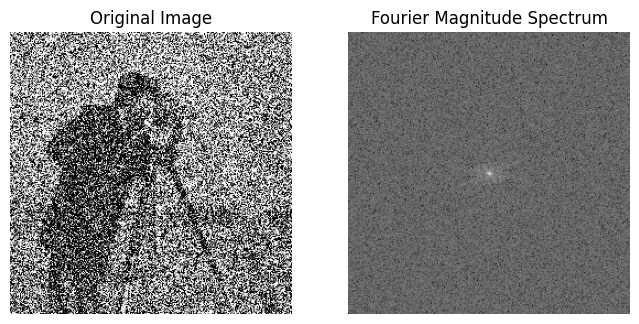

In [21]:
save_and_plot_fft(img_gauss_large, "camgauss", "camgauss_spectrum")

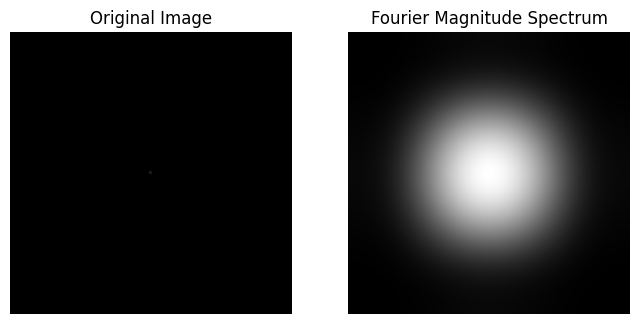

In [22]:
pad_kern = np.zeros_like(img, dtype=np.float32)
kern = gaussian_kernel(5, sigma=1)
kh, kw = kern.shape
r, c = img.shape

# # Compute starting indices for centering
start_x = (r - kh) // 2
start_y = (c - kw) // 2
plt.imsave("gauss_small.png", kern, cmap="gray")
pad_kern[start_x:start_x+kh, start_y:start_y+kw] = kern
save_and_plot_fft(pad_kern, "gauss", "gauss_spectrum")

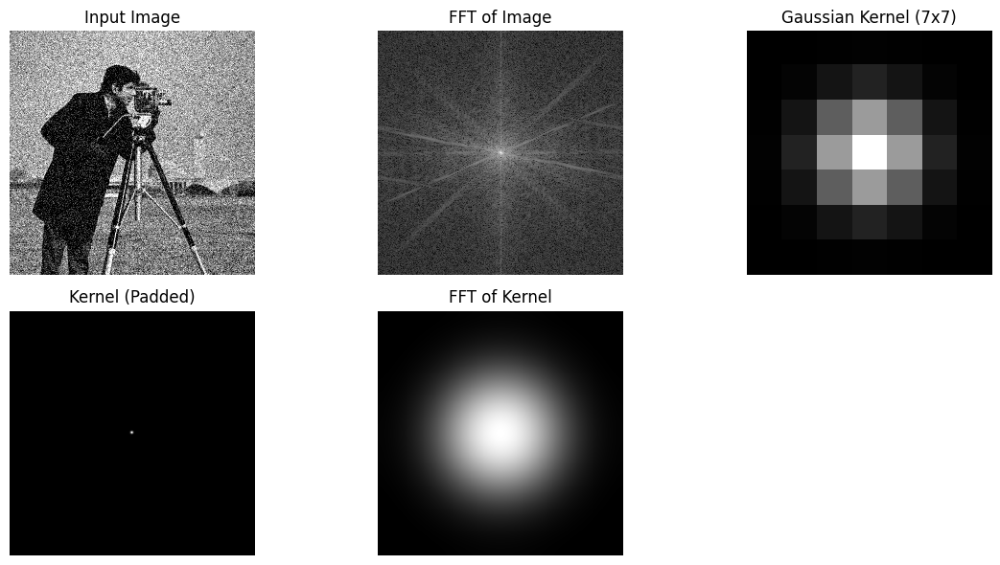

In [23]:
kern = gaussian_kernel(7, sigma=1)
# Pad kernel to match image size, centered
pad_kern = np.zeros_like(img, dtype=np.float32)
kh, kw = kern.shape
r, c = img.shape

# # Compute starting indices for centering
start_x = (r - kh) // 2
start_y = (c - kw) // 2

pad_kern[start_x:start_x+kh, start_y:start_y+kw] = kern


# Compute FFTs
fshift_img, mag_img = compute_fft(img_gauss_smallest)
fshift_kern, mag_kern = compute_fft(pad_kern)

# Plot results1
plt.figure(figsize=(12,6))

plt.subplot(2,3,1)
plt.imshow(img_gauss, cmap='gray')
plt.title("Input Image")
plt.axis('off')

plt.subplot(2,3,2)
plt.imshow(mag_img, cmap='gray')
plt.title("FFT of Image")
plt.axis('off')

plt.subplot(2,3,3)
plt.imshow(kern, cmap='gray')
plt.title("Gaussian Kernel (7x7)")
plt.axis('off')

plt.subplot(2,3,4)
plt.imshow(pad_kern, cmap='gray')
plt.title("Kernel (Padded)")
plt.axis('off')

plt.subplot(2,3,5)
plt.imshow(mag_kern, cmap='gray')
plt.title("FFT of Kernel")
plt.axis('off')

plt.tight_layout()
plt.show()

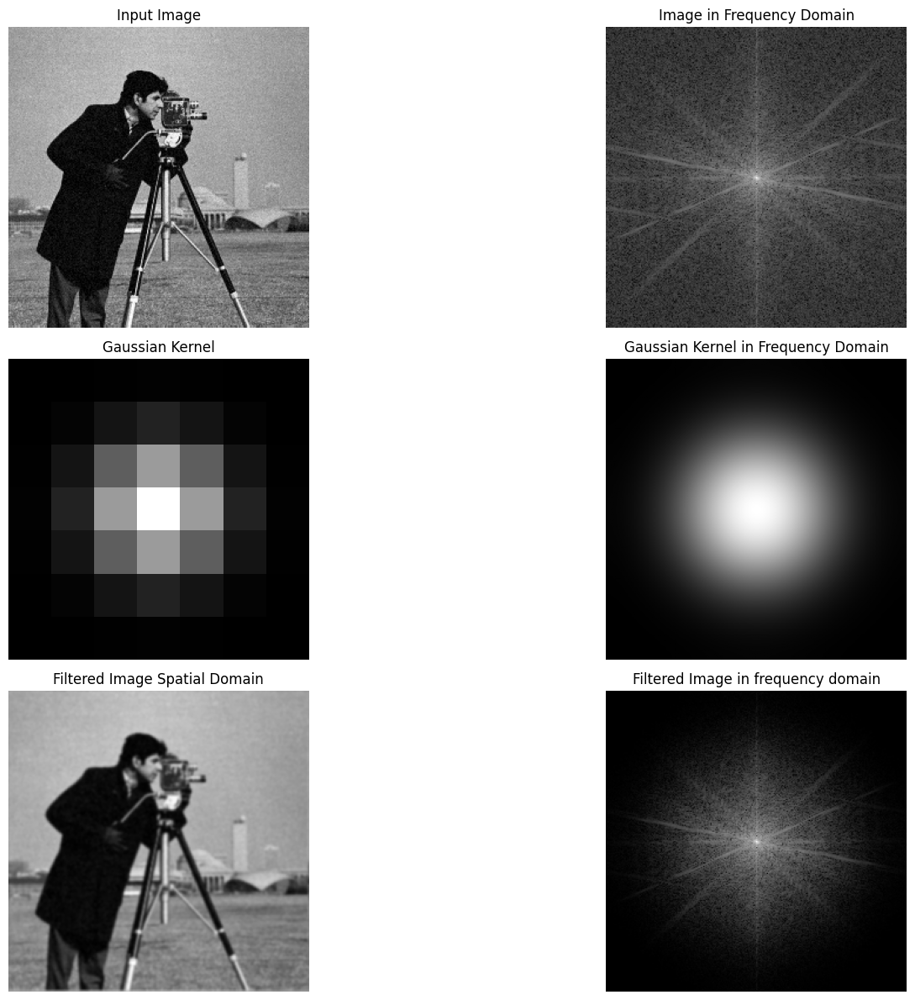

In [24]:
# Filtering in frequency domain
filtered_fft = fshift_img * fshift_kern
filtered_fft_mag = np.log(np.abs(filtered_fft) + 1)
filtered_img = np.fft.ifft2(np.fft.ifftshift(filtered_fft))
filtered_img = np.abs(fftshift(filtered_img))

# Show results
plt.figure(figsize=(18,12))
plt.subplot(3,2,1)
plt.imshow(img_gauss_smallest, cmap='gray')
plt.title("Input Image")
plt.axis('off')

plt.subplot(3,2,2)
plt.imshow(mag_img, cmap='gray')
plt.title("Image in Frequency Domain")
plt.axis('off')

plt.subplot(3,2,3)
plt.imshow(kern, cmap='gray')
plt.title("Gaussian Kernel")
plt.axis('off')

plt.subplot(3,2,4)
plt.imshow(mag_kern, cmap='gray')
plt.title("Gaussian Kernel in Frequency Domain")
plt.axis('off')


plt.subplot(3,2,5)
plt.imshow(filtered_img, cmap='gray')
plt.title("Filtered Image Spatial Domain")
plt.axis('off')

plt.subplot(3,2,6)
plt.imshow(filtered_fft_mag, cmap='gray')
plt.title("Filtered Image in frequency domain")
plt.axis('off')
plt.tight_layout()
plt.show()

plt.imsave("filtered_fft_mag.png", filtered_fft_mag, cmap="gray")
plt.imsave("filtered_img.png", filtered_img, cmap="gray")

## 4) Discussion & comparisons

- Median filtering is non-linear and cannot be represented simply as multiplication in the frequency domain.
- Bilateral filter is also non-linear and edge-preserving;

**Explain briefly from the formula of Bilateral Filtering, why Bilateral Filtering is non-linear**

Write Answer Here.

Why Bilateral Filtering is Non-Linear?

The bilateral filter output at pixel location \(i\) is given by:

\[
I_{\text{filtered}}(i) = \frac{1}{W_i} \sum_{j \in \mathcal{N}(i)} I(j) \cdot \exp\left(-\frac{\|i - j\|^2}{2\sigma_d^2}\right) \cdot \exp\left(-\frac{|I(i) - I(j)|^2}{2\sigma_r^2}\right)
\]

where

- \(\mathcal{N}(i)\) is the neighborhood around pixel \(i\),
- \(I(j)\) is the intensity at pixel \(j\),
- \(W_i = \sum_{j \in \mathcal{N}(i)} \exp\left(-\frac{\|i - j\|^2}{2\sigma_d^2}\right) \exp\left(-\frac{|I(i) - I(j)|^2}{2\sigma_r^2}\right)\) is the normalization factor,
- \(\sigma_d\) controls the spatial (domain) extent,
- \(\sigma_r\) controls the intensity (range) extent.

### Explanation:

- The weights depend not only on the spatial distance \(\|i - j\|\), but also on the **intensity difference** \(|I(i) - I(j)|\).
- Since the weight assigned to each neighbor pixel depends on the **intensity of the center pixel \(I(i)\)** itself, the filtering cannot be represented as a simple linear convolution.
- This input-dependent weighting makes bilateral filtering an **adaptive, non-linear filter**.
- Unlike linear filters (e.g., Gaussian blur), where weights are fixed for all pixels, the bilateral filter adapts weights according to local pixel intensities, preserving edges while smoothing.

Thus, **bilateral filtering is non-linear because the filter weights depend on the signal (image) values themselves.**


### Exercises (Try-it-yourself)

---

#### 1. Spatial vs Frequency Domain Filtering

- Perform **spatial-domain filtering (convolution)** on an image using:
  - Box (uniform) filter  
  - Gaussian filter  

- Perform the **same filtering via frequency-domain multiplication**:
  - Take the Fourier transform of the image and of the filter  
  - Multiply them  
  - Apply the inverse FFT  

- Compare:
  - Spatial vs frequency-domain results (visual comparison and quantitative metrics like **MSE** or **PSNR**)  
  - Does the Fourier-domain implementation reproduce spatial convolution exactly?  
  - Explain differences if any

- Plot:
  - Magnitude spectrum of the Fourier transform (log magnitude / dB) for **Box filter** and **Gaussian filter**  
  - Discuss which filter is “better” and why, based on their frequency response.  

- Apply both filters to several test images:
  - Include at least one image with strong **high-frequency content** (e.g., checkerboard, text).  
  - Discuss differences (edge blurring, ringing artifacts, texture preservation, etc.).  

---

#### 2. Fourier Transform of Simple and Real Images

- Take **5 images** of your choice:
  - **3 simple signals** (easy to compute Fourier transforms analytically)  
    - Examples: Rectangular box, Circular disk, Exponential decay, Circular ring, Single line, etc.  
  - **2 natural images** of your choice (e.g., low-light, noisy, rainy, etc.)  

- Tasks:
  - Compute and visualize their Fourier transforms.  
  - List observations about frequency content.  
  - (Tip: resize large images → Fourier transform is slow on large inputs).  

---

#### 3. Frequency-Domain High-Pass Filtering

- Implement a **frequency-domain high-pass filter** defined as:  

  $$
  H_{\text{high-pass}}(u,v) = 1 - H_{\text{low-pass}}(u,v)
  $$

- Use low-pass filters:
  - Gaussian  
  - Box blur  

- Apply the high-pass filter to an image.  
- Add the filtered result back to the original image to observe **edge enhancement**.  

---



Spatial vs Frequency Comparison:
     Filter  MSE (spatial vs freq)  PSNR (dB)  Max abs diff
0       Box               0.000851  30.701190      0.324328
1  Gaussian               0.000716  31.451407      0.309421

Filtered vs Original:
  Filtered Image  MSE vs Original  PSNR vs Original (dB)
0    Box_spatial         0.008183              20.870964
1       Box_freq         0.009071              20.423628
2  Gauss_spatial         0.007790              21.084872
3     Gauss_freq         0.008863              20.523965


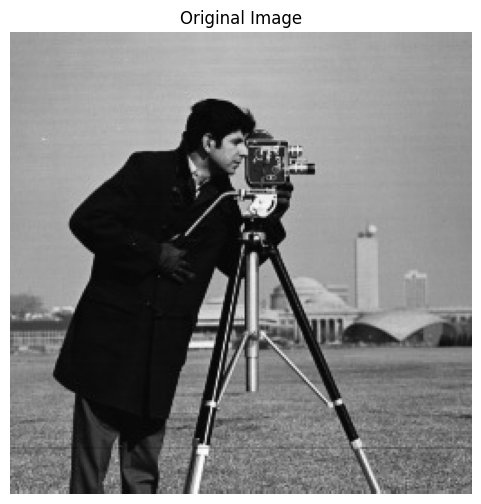

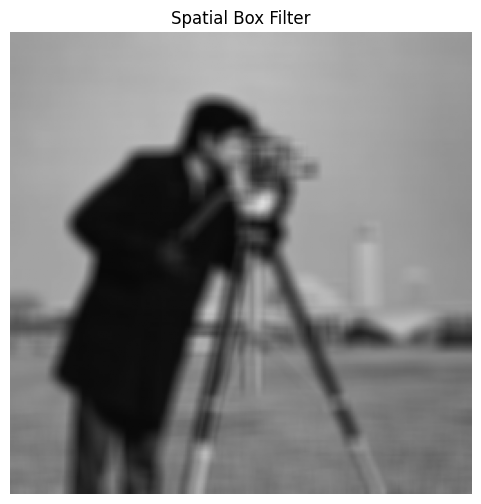

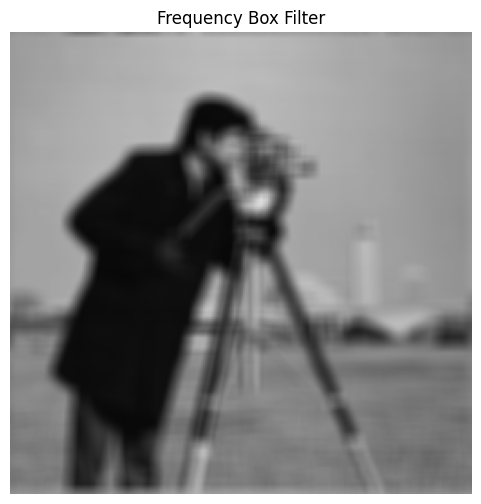

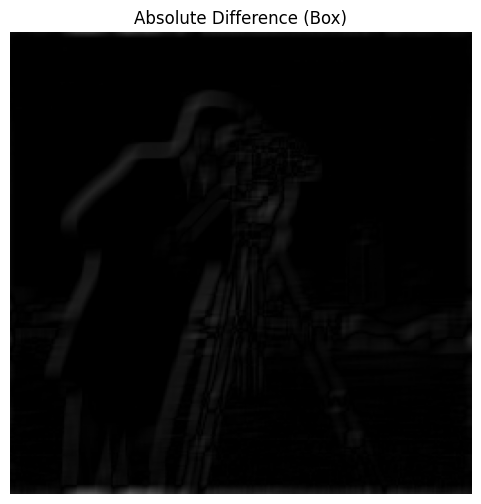

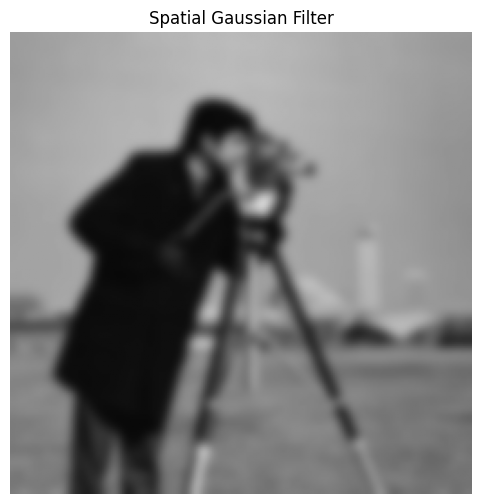

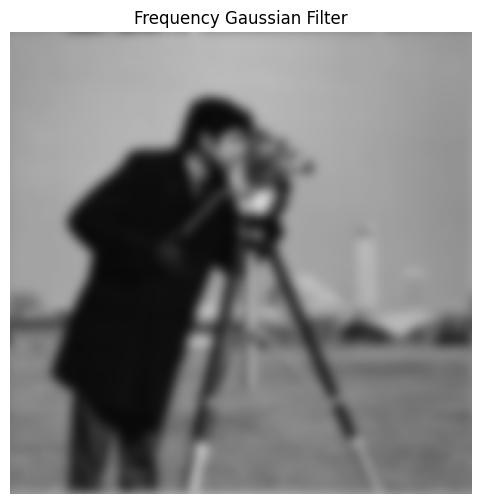

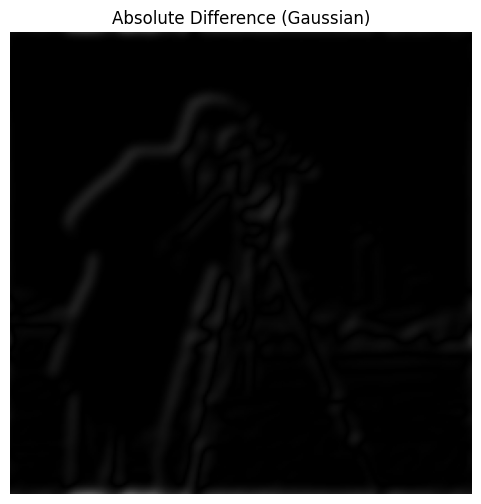

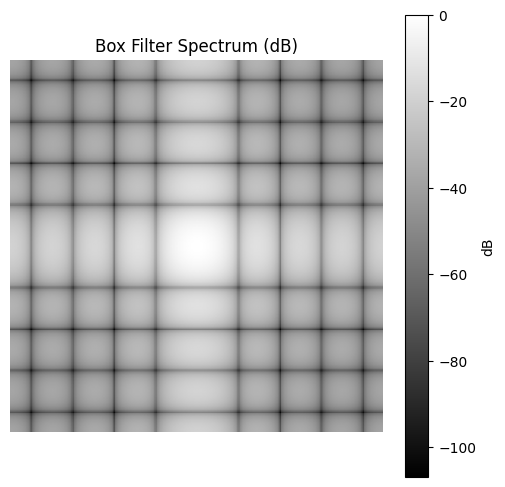

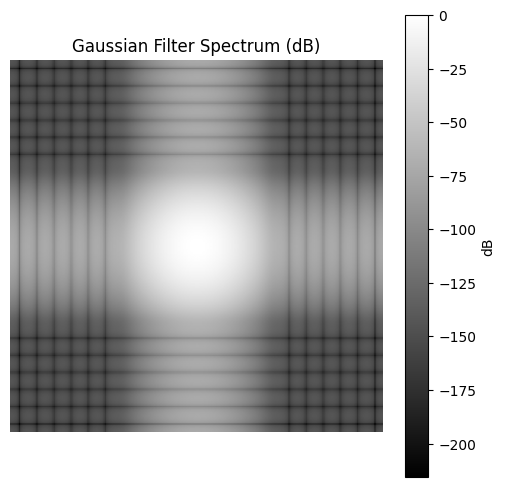

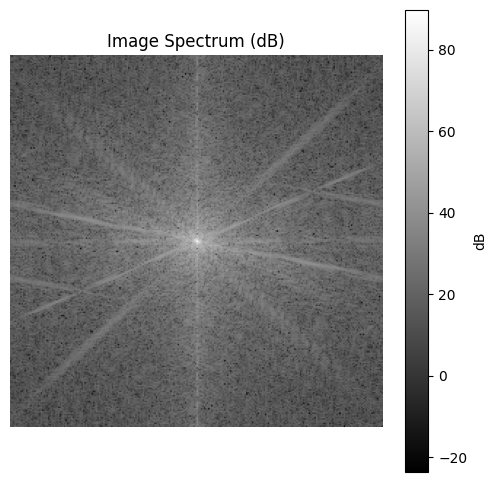

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, img_as_float
from scipy import signal
import pandas as pd
from math import log10

# ---------- Helper Functions ----------
def mse(a, b):
    return np.mean((a - b) ** 2)

def psnr(a, b, data_range=1.0):
    m = mse(a, b)
    if m == 0:
        return float('inf')
    return 10 * log10((data_range ** 2) / m)

def pad_kernel_to_image(kernel, imshape):
    """Zero-pad kernel to image shape and center it for FFT multiplication"""
    pad = np.zeros(imshape, dtype=kernel.dtype)
    kh, kw = kernel.shape
    pad[:kh, :kw] = kernel
    pad = np.roll(pad, -kh//2, axis=0)
    pad = np.roll(pad, -kw//2, axis=1)
    return pad

def freq_conv(image, kernel):
    H, W = image.shape
    Kpad = pad_kernel_to_image(kernel, (H, W))
    F_img = np.fft.fft2(image)
    F_k = np.fft.fft2(Kpad)
    out = np.fft.ifft2(F_img * F_k)
    return np.real(out), F_k

def show_image(imgarr, title):
    plt.figure(figsize=(6,6))
    plt.imshow(imgarr, cmap='gray', vmin=0, vmax=1)
    plt.title(title)
    plt.axis('off')
    plt.show()

def show_mag_spectrum(Fk, title):
    eps = 1e-12
    Fshift = np.fft.fftshift(Fk)
    mag = np.abs(Fshift)
    mag_db = 20 * np.log10(mag + eps)
    plt.figure(figsize=(6,6))
    plt.imshow(mag_db, cmap='gray')
    plt.title(title)
    plt.colorbar(label='dB')
    plt.axis('off')
    plt.show()

# ---------- Load Image ----------
img_path = '/content/cameraman.jpeg'  # Update if needed
img = img_as_float(io.imread(img_path, as_gray=True))

# ---------- Create Filters ----------
box_size = 9
box = np.ones((box_size, box_size), dtype=float) / (box_size * box_size)

gauss_sigma = 3.0
gksize = int(gauss_sigma * 7) | 1  # odd size
ax = np.arange(-gksize//2 + 1, gksize//2 + 1)
xx, yy = np.meshgrid(ax, ax)
gauss = np.exp(-(xx**2 + yy**2) / (2 * gauss_sigma**2))
gauss /= gauss.sum()

# ---------- Spatial Convolution ----------
spatial_box = signal.convolve2d(img, box, mode='same', boundary='symm')
spatial_gauss = signal.convolve2d(img, gauss, mode='same', boundary='symm')

# ---------- Frequency-Domain Convolution ----------
freq_box, F_box = freq_conv(img, box)
freq_gauss, F_gauss = freq_conv(img, gauss)

# ---------- Compute Metrics ----------
metrics = []
for name, s, f in [("Box", spatial_box, freq_box), ("Gaussian", spatial_gauss, freq_gauss)]:
    metrics.append((name, mse(s, f), psnr(s, f), np.max(np.abs(s - f))))

df = pd.DataFrame(metrics, columns=["Filter", "MSE (spatial vs freq)", "PSNR (dB)", "Max abs diff"])
print("\nSpatial vs Frequency Comparison:")
print(df)

metrics_orig = []
for name, out in [("Box_spatial", spatial_box), ("Box_freq", freq_box),
                  ("Gauss_spatial", spatial_gauss), ("Gauss_freq", freq_gauss)]:
    metrics_orig.append((name, mse(img, out), psnr(img, out)))

df2 = pd.DataFrame(metrics_orig, columns=["Filtered Image", "MSE vs Original", "PSNR vs Original (dB)"])
print("\nFiltered vs Original:")
print(df2)

# ---------- Display Images ----------
show_image(img, "Original Image")
show_image(spatial_box, "Spatial Box Filter")
show_image(freq_box, "Frequency Box Filter")
show_image(np.abs(spatial_box - freq_box), "Absolute Difference (Box)")

show_image(spatial_gauss, "Spatial Gaussian Filter")
show_image(freq_gauss, "Frequency Gaussian Filter")
show_image(np.abs(spatial_gauss - freq_gauss), "Absolute Difference (Gaussian)")

# ---------- Show Magnitude Spectra ----------
show_mag_spectrum(F_box, "Box Filter Spectrum (dB)")
show_mag_spectrum(F_gauss, "Gaussian Filter Spectrum (dB)")
show_mag_spectrum(np.fft.fft2(img), "Image Spectrum (dB)")


Interpretation: the frequency-domain outputs are very close to the spatial ones (PSNR ~30–31 dB between them), but not identical. The Gaussian case is slightly closer (lower MSE, higher PSNR) than the box.

Kernel placement / centering and padding.

To do linear convolution via FFT you must zero-pad the kernel to the image size and center it correctly (or pad the image appropriately). Small misalignments (off-by-one rolls) yield visible differences.

3) Why Gaussian tended to match spatial result a bit better than the box

Gaussian’s frequency response is smooth and concentrated near DC, so the multiplication in the frequency domain is numerically stable and less prone to produce oscillatory artifacts. Also, a Gaussian kernel is spatially smoother and less abrupt; that reduces aliasing and makes centering/padding errors less damaging.

Box kernel has sharp edges in space ⇒ its Fourier transform is sinc-like with oscillatory side lobes. Those oscillations are sensitive to sampling, alignment and boundary differences, so small mismatches produce larger visible differences (and slightly higher MSE).

That explains why your Gaussian MSE (7.16e-4) is a bit lower than the box MSE (8.51e-4).

Conclusion: For general-purpose smoothing Gaussian is usually better (fewer artifacts, no ringing). Box is simple and cheap (and separable / fast with integral image tricks) but gives poorer frequency control and potential ringing.

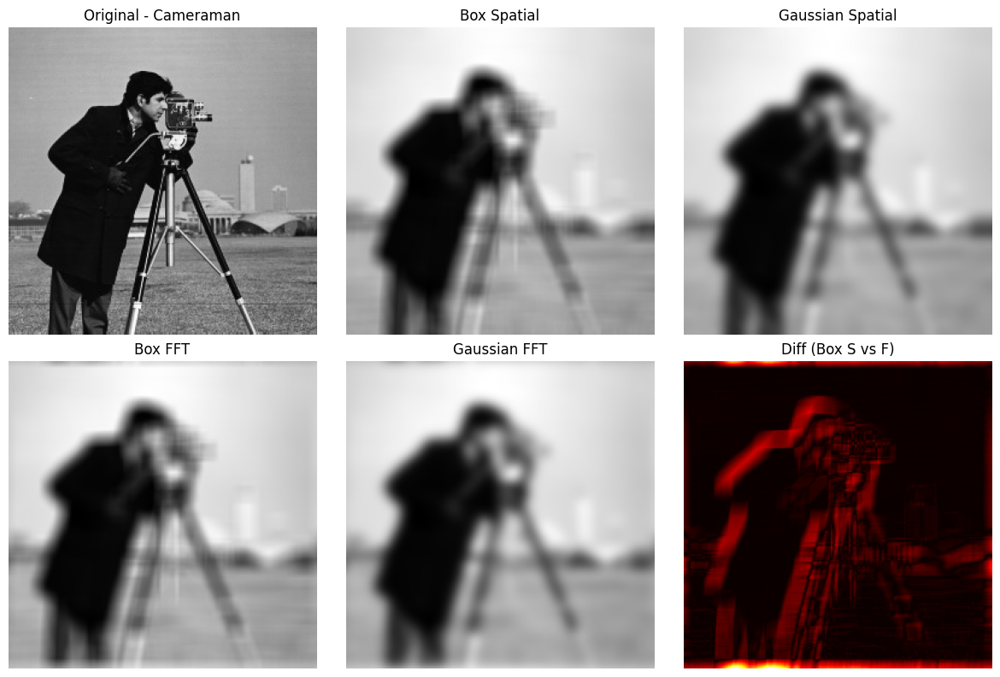

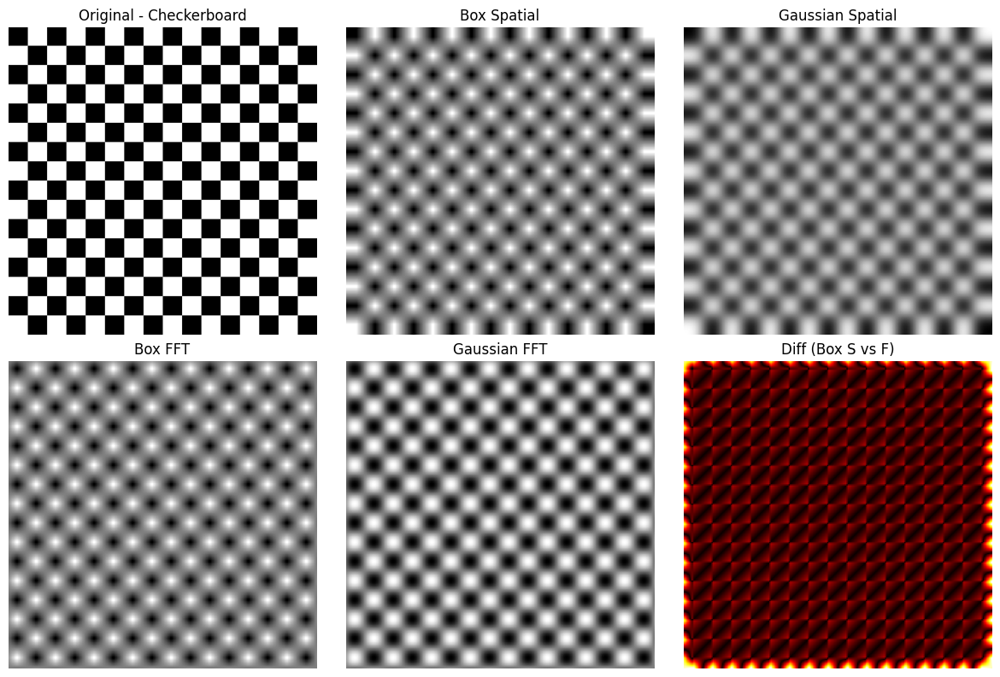

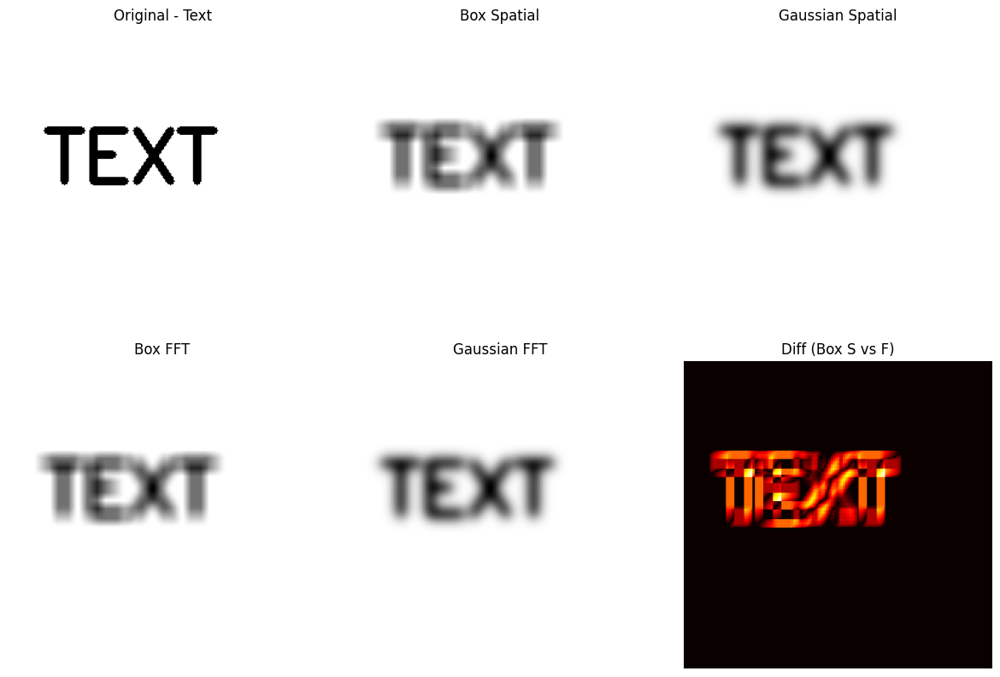


--- Observations ---
Box filter causes stronger edge blurring and visible ringing near high-contrast transitions, especially in the checkerboard image.
Gaussian filter produces smoother, more natural blur with no visible ripples, better preserving gradual intensity changes.
In text image, Box filter smears edges and introduces faint oscillations around characters, while Gaussian smooths without ringing.
FFT-based and spatial results differ slightly due to boundary conditions (circular vs symmetric).


In [26]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
from numpy.fft import fft2, ifft2, fftshift

# ==========================
# 1. Load Original Image
# ==========================
orig = cv2.imread('/content/cameraman.jpeg', cv2.IMREAD_GRAYSCALE)
orig = orig.astype(np.float32) / 255.0

# ==========================
# 2. Generate High-Frequency Test Images
# ==========================

# Checkerboard pattern
def generate_checkerboard(size=256, num_checks=8):
    row_check = np.arange(size) // (size // num_checks)
    col_check = row_check[:, None]
    checkerboard = ((row_check + col_check) % 2).astype(np.float32)
    return checkerboard

# Text image
def generate_text_image(size=256, text="TEST", font=cv2.FONT_HERSHEY_SIMPLEX):
    img = np.ones((size, size), dtype=np.float32)
    cv2.putText(img, text, (30, size // 2), font, 2, (0,), 5, cv2.LINE_AA)
    return img

checker = generate_checkerboard(256, 16)
text_img = generate_text_image(256, "TEXT")

# Collect test images
images = {
    "Cameraman": orig,
    "Checkerboard": checker,
    "Text": text_img
}

# ==========================
# 3. Create Filters
# ==========================
box_size = 15
box_filter = np.ones((box_size, box_size), np.float32) / (box_size**2)

sigma = 5
k_size = 2 * int(3 * sigma) + 1
gaussian_filter = cv2.getGaussianKernel(k_size, sigma) @ cv2.getGaussianKernel(k_size, sigma).T

# ==========================
# 4. Define Filtering Functions
# ==========================
def spatial_filter(img, kernel):
    return convolve2d(img, kernel, mode='same', boundary='symm')

def freq_filter(img, kernel):
    H, W = img.shape
    pad_kernel = np.zeros_like(img)
    kh, kw = kernel.shape
    pad_kernel[:kh, :kw] = kernel
    # Center the kernel
    pad_kernel = np.roll(pad_kernel, -kh//2, axis=0)
    pad_kernel = np.roll(pad_kernel, -kw//2, axis=1)

    IMG = fft2(img)
    KER = fft2(pad_kernel)
    result = np.real(ifft2(IMG * KER))
    return result

# ==========================
# 5. Apply Filters
# ==========================
results = {}
for name, img in images.items():
    results[name] = {
        'orig': img,
        'box_spatial': spatial_filter(img, box_filter),
        'gauss_spatial': spatial_filter(img, gaussian_filter),
        'box_freq': freq_filter(img, box_filter),
        'gauss_freq': freq_filter(img, gaussian_filter)
    }

# ==========================
# 6. Display Results
# ==========================
def show_results_for(name, res):
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    axes = axes.ravel()
    axes[0].imshow(res['orig'], cmap='gray')
    axes[0].set_title(f"Original - {name}")
    axes[1].imshow(res['box_spatial'], cmap='gray')
    axes[1].set_title("Box Spatial")
    axes[2].imshow(res['gauss_spatial'], cmap='gray')
    axes[2].set_title("Gaussian Spatial")
    axes[3].imshow(res['box_freq'], cmap='gray')
    axes[3].set_title("Box FFT")
    axes[4].imshow(res['gauss_freq'], cmap='gray')
    axes[4].set_title("Gaussian FFT")
    axes[5].imshow(np.abs(res['box_spatial'] - res['box_freq']), cmap='hot')
    axes[5].set_title("Diff (Box S vs F)")
    for ax in axes: ax.axis('off')
    plt.tight_layout()
    plt.show()

for name in results:
    show_results_for(name, results[name])

# ==========================
# 7. Observations
# ==========================
print("\n--- Observations ---")
print("Box filter causes stronger edge blurring and visible ringing near high-contrast transitions, especially in the checkerboard image.")
print("Gaussian filter produces smoother, more natural blur with no visible ripples, better preserving gradual intensity changes.")
print("In text image, Box filter smears edges and introduces faint oscillations around characters, while Gaussian smooths without ringing.")
print("FFT-based and spatial results differ slightly due to boundary conditions (circular vs symmetric).")


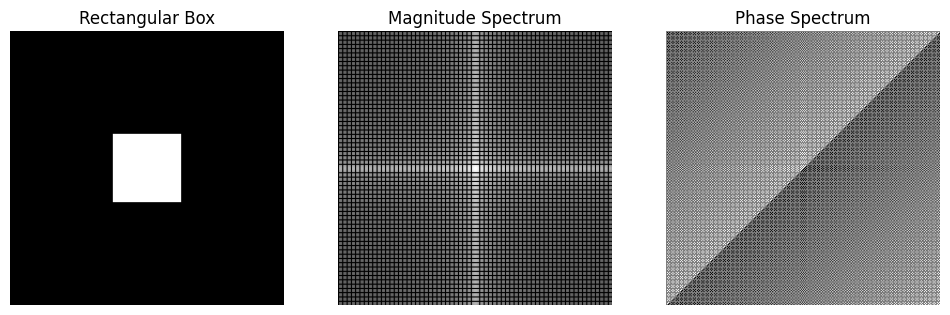

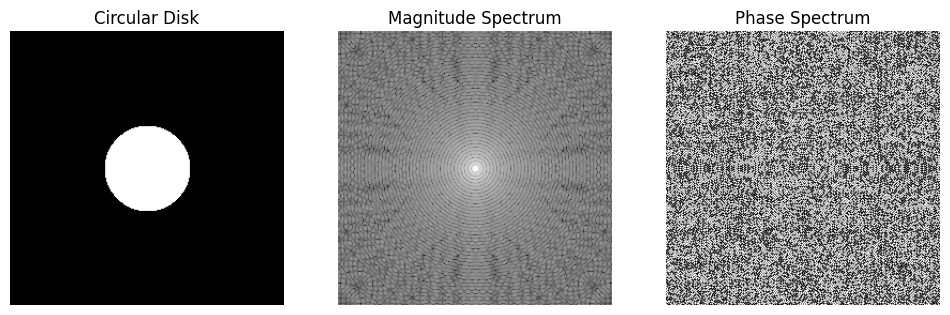

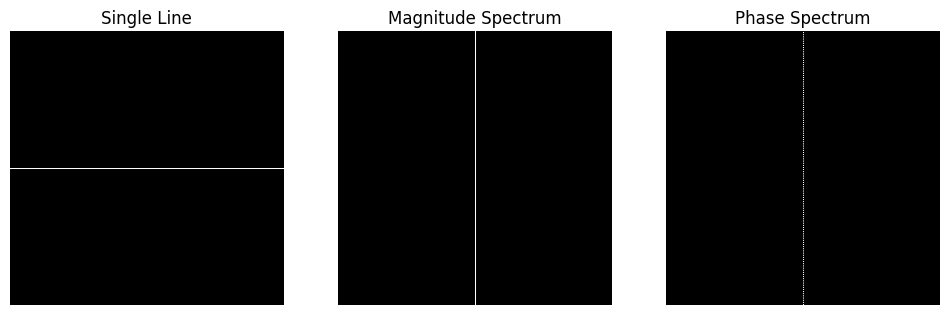

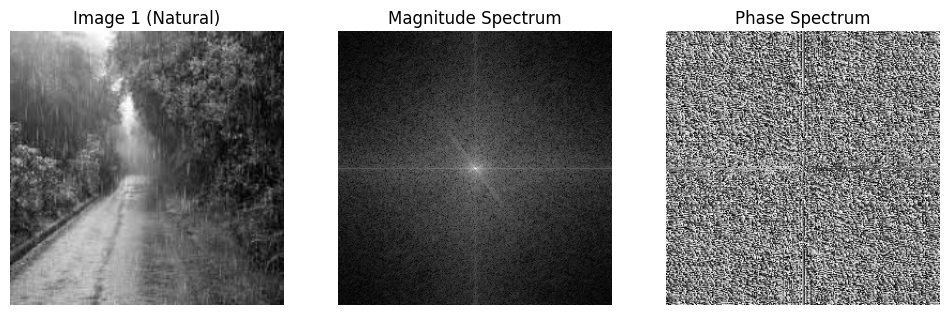

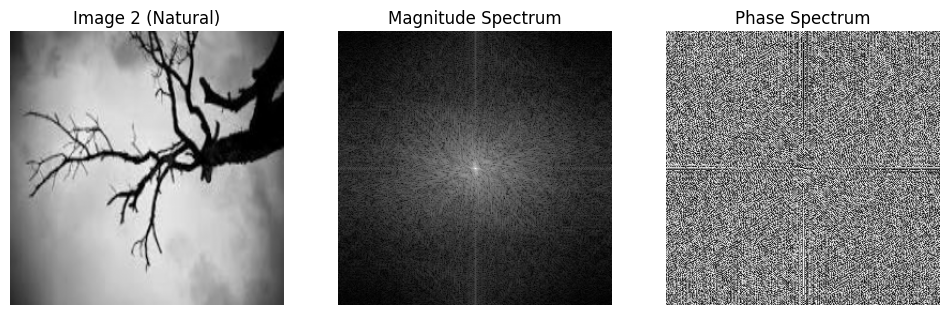

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.draw import disk
from skimage import data, color
import cv2

# Utility function: compute FFT and display
def show_fft(img, title="Image"):
    # Convert to float and normalize
    img = img.astype(float)

    # Compute 2D FFT
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)

    magnitude_spectrum = np.log1p(np.abs(fshift))
    phase_spectrum = np.angle(fshift)

    # Plot
    fig, ax = plt.subplots(1, 3, figsize=(12, 4))
    ax[0].imshow(img, cmap='gray')
    ax[0].set_title(title)
    ax[1].imshow(magnitude_spectrum, cmap='gray')
    ax[1].set_title('Magnitude Spectrum')
    ax[2].imshow(phase_spectrum, cmap='gray')
    ax[2].set_title('Phase Spectrum')
    for a in ax:
        a.axis('off')
    plt.show()


# 1. SIMPLE SIGNALS
# A. Rectangular box
box = np.zeros((256,256))
box[96:160,96:160] = 255  # center square
show_fft(box, "Rectangular Box")

# B. Circular disk
circle = np.zeros((256,256))
rr, cc = disk((128,128), 40)
circle[rr, cc] = 255
show_fft(circle, "Circular Disk")

# C. Single Line
line = np.zeros((256,256))
line[128,:] = 255
show_fft(line, "Single Line")

# 2. NATURAL IMAGES
# Read images
img1 = io.imread('/content/download (1).jpeg')
img2 = io.imread('/content/download.jpeg')

# Resize first to desired shape
img1_resized = cv2.resize(img1, (256,256))
img2_resized = cv2.resize(img2, (256,256))

# Convert to grayscale after resizing
img1_gray = color.rgb2gray(img1_resized)
img2_gray = color.rgb2gray(img2_resized)

# Show FFT for grayscale images
show_fft(img1_gray, "Image 1 (Natural)")
show_fft(img2_gray, "Image 2 (Natural)")

Rectangular Box

Fourier Transform: Strong central DC component, sinc-like pattern in both directions (due to sharp edges).

More edges → higher frequencies.

Circular Disk

Transform: Circularly symmetric pattern (Bessel-like rings).

Indicates isotropic frequency content.

Single Line

Transform: Perpendicular frequency orientation (line → FT perpendicular to line).

Natural Images

Most energy in low frequencies (center of spectrum).

High-frequency details appear as faint outer patterns.

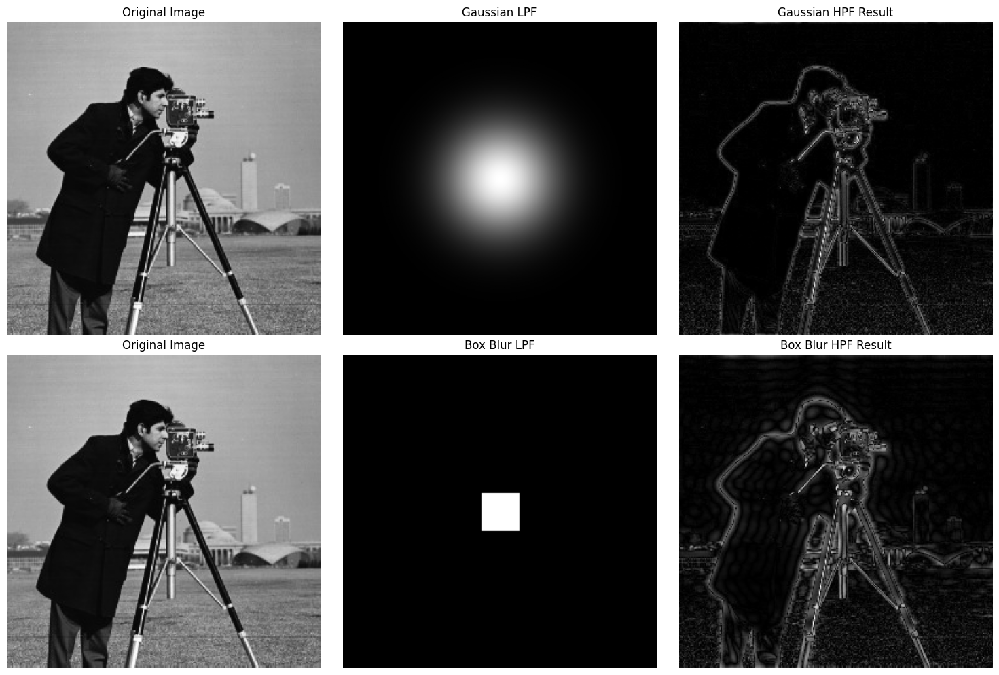

(array([[168, 167, 165, ..., 160, 160, 161],
        [164, 163, 162, ..., 156, 156, 157],
        [161, 160, 157, ..., 152, 152, 153],
        ...,
        [121, 135, 139, ..., 149, 136, 121],
        [126, 128, 130, ..., 130, 139, 126],
        [134, 136, 139, ..., 136, 134, 133]], dtype=uint8),
 array([[168, 168, 166, ..., 168, 165, 163],
        [168, 166, 164, ..., 165, 163, 163],
        [165, 162, 158, ..., 159, 157, 155],
        ...,
        [129, 132, 133, ..., 152, 135, 127],
        [134, 136, 138, ..., 133, 139, 131],
        [138, 141, 142, ..., 135, 133, 136]], dtype=uint8))

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image (grayscale)
def load_image(path):
    image = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    return image

# Gaussian low-pass filter in frequency domain
def gaussian_low_pass(shape, cutoff):
    P, Q = shape
    u = np.arange(P) - P // 2
    v = np.arange(Q) - Q // 2
    U, V = np.meshgrid(u, v, indexing='ij')
    D = np.sqrt(U**2 + V**2)
    H = np.exp(-(D**2) / (2 * (cutoff**2)))
    return H

# Box blur low-pass filter in frequency domain
def box_low_pass(shape, cutoff):
    P, Q = shape
    H = np.zeros(shape)
    center_p, center_q = P // 2, Q // 2
    H[center_p - cutoff:center_p + cutoff + 1, center_q - cutoff:center_q + cutoff + 1] = 1
    return H

# Frequency domain filter application
def apply_frequency_filter(image, H):
    # Fourier transform
    f = np.fft.fft2(image)
    f_shift = np.fft.fftshift(f)
    # Filter application
    f_filt = f_shift * H
    # Inverse Fourier transform
    f_ishift = np.fft.ifftshift(f_filt)
    img_back = np.fft.ifft2(f_ishift)
    img_back = np.abs(img_back)
    return img_back

# Main function
def high_pass_filter_edge_enhancement(image_path, cutoff_gauss=30, cutoff_box=15):
    img = load_image(image_path)
    shape = img.shape

    # Gaussian LPF and corresponding HPF
    H_gauss = gaussian_low_pass(shape, cutoff_gauss)
    H_gauss_hp = 1 - H_gauss
    img_gauss_hp = apply_frequency_filter(img, H_gauss_hp)

    # Box blur LPF and corresponding HPF
    H_box = box_low_pass(shape, cutoff_box)
    H_box_hp = 1 - H_box
    img_box_hp = apply_frequency_filter(img, H_box_hp)

    # Edge enhancement by adding high-pass filtered image
    img_gauss_enhanced = np.clip(img + img_gauss_hp, 0, 255).astype(np.uint8)
    img_box_enhanced = np.clip(img + img_box_hp, 0, 255).astype(np.uint8)

    # Plotting
    fig, ax = plt.subplots(2, 3, figsize=(15, 10))
    ax[0, 0].imshow(img, cmap='gray')
    ax[0, 0].set_title('Original Image')
    ax[0, 1].imshow(H_gauss, cmap='gray')
    ax[0, 1].set_title('Gaussian LPF')
    ax[0, 2].imshow(img_gauss_hp, cmap='gray')
    ax[0, 2].set_title('Gaussian HPF Result')

    ax[1, 0].imshow(img, cmap='gray')
    ax[1, 0].set_title('Original Image')
    ax[1, 1].imshow(H_box, cmap='gray')
    ax[1, 1].set_title('Box Blur LPF')
    ax[1, 2].imshow(img_box_hp, cmap='gray')
    ax[1, 2].set_title('Box Blur HPF Result')

    for a in ax.flatten():
        a.axis('off')

    plt.tight_layout()
    plt.show()

    return img_gauss_enhanced, img_box_enhanced


# Run the code with your image path
image_path = '/content/cameraman.jpeg'
high_pass_filter_edge_enhancement(image_path)


### Compute histogram

(375, 500)
Max pixel difference between manual and OpenCV: 1


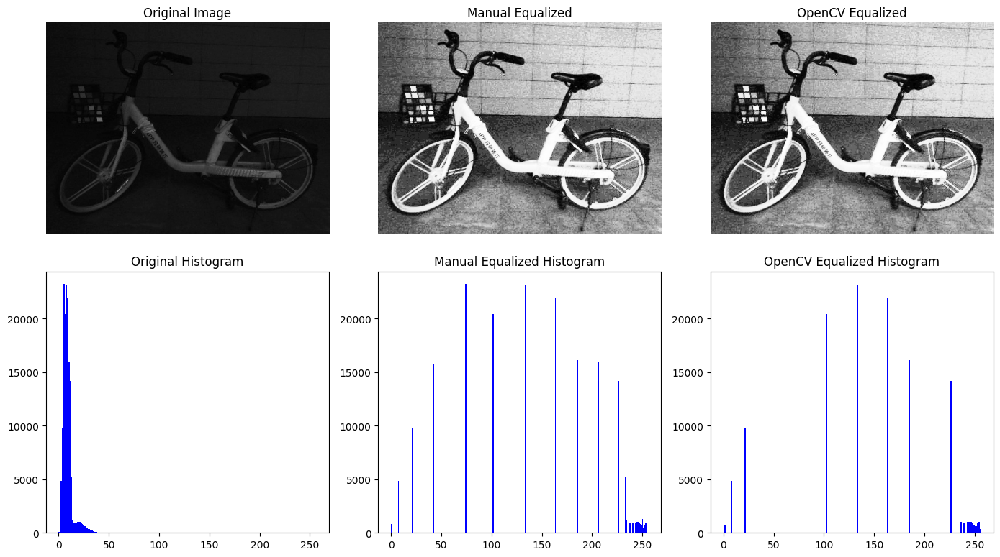

In [29]:
img = load_gray_image("ll.JPG")

def hist_eq(img):
  # If img is already normalized float32 [0,1], convert it back to uint8 [0,255]
  if img.dtype == np.float32 or img.dtype == np.float64:
      if img.max() <= 1.0:   # assume normalized
          img_uint8 = (img * 255).astype(np.uint8)
      else:
          img_uint8 = img.astype(np.uint8)
  else:
      img_uint8 = img

  # -------- Manual Histogram Equalization --------
  # Step 1: Histogram
  hist, bins = np.histogram(img_uint8.flatten(), 256, [0,256])

  # Step 2: CDF
  cdf = hist.cumsum()

  # Step 3: Normalize CDF
  cdf_min = cdf[cdf > 0].min()
  cdf_max = cdf.max()
  cdf_scaled = (cdf - cdf_min) * 255 / (cdf_max - cdf_min)
  cdf_scaled = cdf_scaled.astype(np.uint8)

  # Step 4: Apply mapping
  manual_eq = cdf_scaled[img_uint8]

  # -------- OpenCV Histogram Equalization --------
  opencv_eq = cv2.equalizeHist(img_uint8)

  # -------- Difference Check --------
  diff = np.abs(manual_eq.astype(int) - opencv_eq.astype(int))
  print("Max pixel difference between manual and OpenCV:", diff.max())

  return img_uint8, manual_eq, opencv_eq

img_uint8, manual_eq, opencv_eq = hist_eq(img)

# -------- Plot Results --------
plt.figure(figsize=(14,8))

plt.subplot(2,3,1)
plt.title("Original Image")
plt.imshow(img_uint8, cmap="gray")
plt.axis("off")

plt.subplot(2,3,2)
plt.title("Manual Equalized")
plt.imshow(manual_eq, cmap="gray")
plt.axis("off")

plt.subplot(2,3,3)
plt.title("OpenCV Equalized")
plt.imshow(opencv_eq, cmap="gray")
plt.axis("off")

plt.subplot(2,3,4)
plt.title("Original Histogram")
plt.hist(img_uint8.flatten(), 256, range=[0,256], color='blue')


plt.subplot(2,3,5)
plt.title("Manual Equalized Histogram")
plt.hist(manual_eq.flatten(), 256, range=[0,256], color='blue')


plt.subplot(2,3,6)
plt.title("OpenCV Equalized Histogram")
plt.hist(opencv_eq.flatten(), 256, range=[0,256], color='blue')


plt.tight_layout()
plt.show()


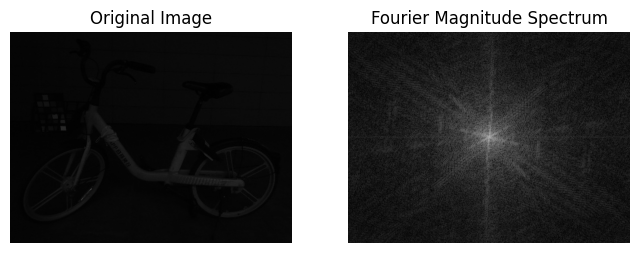

In [30]:

save_and_plot_fft(img, "low_light", "low_light_spectrum")

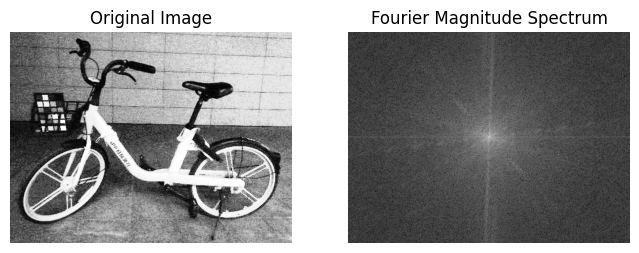

In [31]:
equalized_img = opencv_eq.astype(np.float32) / 255.0
save_and_plot_fft(equalized_img, "low_light_eq", "low_light_eq_spec")

#### Exercise

##### Histogram Equalization

- Take a **hazy image**:
  - Read the image as an RGB image.  
  - Apply **histogram equalization** (compare results on each channel separately vs. on the luminance channel after converting to YCrCb/HSV).  

- Take an **image**:
  - Brighten the image by multiplying with a factor of (0.5 and 2)
  - Read them as RGB image.  
  - Apply histogram equalization on all 3 images (original, darkened and brightened) and observe how the contrast changes.  

- Compare results:
  - Before vs. after equalization  
  - Differences between per-channel equalization and luminance-channel equalization  
  - Comment on whether the image looks **natural** or has **color distortions**.  


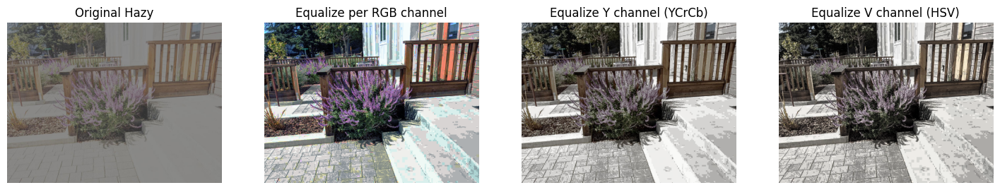

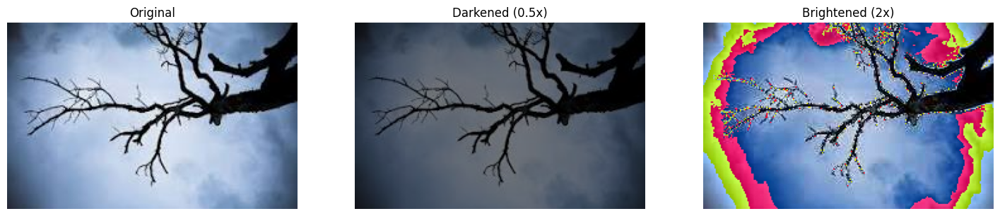

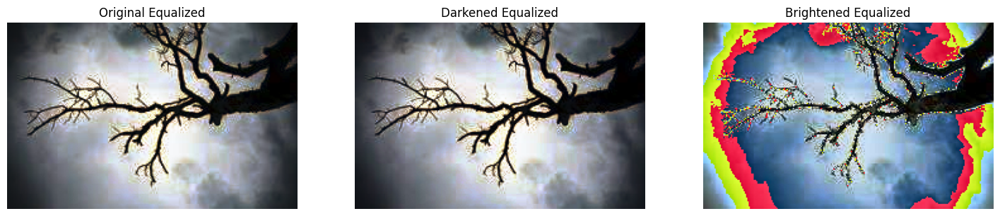

In [32]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def display_images(titles, images):
    """Display list of images with titles side by side."""
    n = len(images)
    plt.figure(figsize=(18, 6))
    for i in range(n):
        plt.subplot(1, n, i+1)
        img_rgb = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)
        plt.imshow(img_rgb)
        plt.title(titles[i])
        plt.axis('off')
    plt.show()

# Read hazy image
hazy_img_path = '/content/haze.png'
hazy_img = cv2.imread(hazy_img_path)

# Histogram equalization per RGB channel on hazy image
hazy_eq_channels = cv2.merge([cv2.equalizeHist(hazy_img[:, :, i]) for i in range(3)])

# Histogram equalization on luminance (Y) channel in YCrCb space
hazy_ycrcb = cv2.cvtColor(hazy_img, cv2.COLOR_BGR2YCrCb)
y, cr, cb = cv2.split(hazy_ycrcb)
y_eq = cv2.equalizeHist(y)
hazy_ycrcb_eq = cv2.merge([y_eq, cr, cb])
hazy_eq_ycrcb = cv2.cvtColor(hazy_ycrcb_eq, cv2.COLOR_YCrCb2BGR)

# Histogram equalization on V channel in HSV space
hazy_hsv = cv2.cvtColor(hazy_img, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hazy_hsv)
v_eq = cv2.equalizeHist(v)
hazy_hsv_eq = cv2.merge([h, s, v_eq])
hazy_eq_hsv = cv2.cvtColor(hazy_hsv_eq, cv2.COLOR_HSV2BGR)

# Display hazy image results
display_images(
    ['Original Hazy', 'Equalize per RGB channel', 'Equalize Y channel (YCrCb)', 'Equalize V channel (HSV)'],
    [hazy_img, hazy_eq_channels, hazy_eq_ycrcb, hazy_eq_hsv]
)

# Read another image
img_path = '/content/download.jpeg'
img = cv2.imread(img_path)

# Create darkened and brightened versions
img_dark = np.clip(img * 0.5, 0, 255).astype(np.uint8)
img_bright = np.clip(img * 2, 0, 255).astype(np.uint8)

# Function to equalize histograms on all channels independently
def equalize_rgb(img):
    return cv2.merge([cv2.equalizeHist(img[:, :, i]) for i in range(3)])

# Equalize histograms for original, dark, and bright images
img_eq = equalize_rgb(img)
img_dark_eq = equalize_rgb(img_dark)
img_bright_eq = equalize_rgb(img_bright)

# Display original, darkened, brightened before equalization
display_images(
    ['Original', 'Darkened (0.5x)', 'Brightened (2x)'],
    [img, img_dark, img_bright]
)

# Display after histogram equalization
display_images(
    ['Original Equalized', 'Darkened Equalized', 'Brightened Equalized'],
    [img_eq, img_dark_eq, img_bright_eq]
)


Histogram equalization can greatly enhance image contrast but may produce unnatural colors, especially when performed on each RGB channel or on heavily brightened images.

Before vs. After Equalization
Original and darkened images: Equalization improves details and contrast, especially in regions with poor visibility. Subtle textures in clouds and branches emerge more clearly after equalization.

Brightened image: Equalization introduces severe color artifacts—vivid patches of red and yellow appear, and tonal transitions are lost. This is due to clipping and oversaturation in the brightened image, which per-channel equalization cannot correct.

Per-Channel vs. Luminance-Channel Equalization
Per-channel equalization (used here) applies the process to each RGB channel independently. This often breaks color relationships, resulting in color distortions, especially in bright or saturated areas. The artifacts and unnatural hues in the rightmost image are direct consequences.

Luminance-channel equalization (done in spaces like YCrCb, HSV, or LCH) affects only the lightness/brightness, preserving chromaticity and hue. This generally provides natural contrast enhancement without disrupting color balance.

Naturalness vs. Color Distortions
Original and darkened images still appear somewhat natural after equalization, though some color exaggeration may occur.

The brightened equalized image is heavily distorted, losing natural color transitions due to enhancements conflicting with already extreme intensities.

For natural results on color images, luminance-channel equalization should be preferred; per-channel methods risk unnatural and posterized effects when intensity range is already pushed.

In summary, per-channel equalization for brightened images causes pronounced color distortions, while equalization on luminance channels typically yields more realistic improvements in contrast and appearance.

